In [1]:
from copy import deepcopy
from pathlib import Path
import json
import os
import pickle
import re
import yaml

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import skimage
import seaborn as sns
import tifffile
import yaml
from einops import rearrange
from scipy.ndimage import binary_fill_holes, binary_erosion, binary_dilation

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG
import mushroom.data.xenium as xenium
import mushroom.data.cosmx as cosmx
import mushroom.data.multiplex as multiplex
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.visualization.tiling_utils as tiling_utils
import mushroom.visualization.helpers as helpers

In [5]:
project_dir = Path('/data/estorrs/mushroom/data/projects/submission_v1/')

In [6]:
os.listdir(project_dir)

['HT553P1-H2',
 'S18-25943-A7',
 'S18-5591-C8',
 'HT413C1-K2',
 'HT339B2-H1',
 'HT413C1-Th1k4A1',
 'kidney',
 'HT565B1-H2',
 'WD-76845',
 'analysis',
 'C3L-00970',
 'HT704B1',
 'C3L-00982',
 'HT225C1',
 'S18-9906',
 'HT268B1',
 'C3L-02551',
 'C3L-01287',
 'HT206B1',
 'HT448C1-Th1K1Fp1',
 'HT397B1']

## case-specific data generation

In [7]:
# case = 'HT704B1'

# dtype_to_channels = {
#     'xenium': ['EPCAM', 'KRT5', 'PTPRC', 'CD4', 'CD8A', 'MS4A1', 'CD68', 'CD163', 'ACTA2', 'PDPN', 'HLA-DQB2', 'LAG3', 'PDCD1', 'GZMB', 'PECAM1'],
#     'multiplex': [
#         'CD20',
#         'CD31',
#         'CD3e',
#         'CD4 (D)',
#         'CD68',
#         'CD8',
#         'CK14 (D)',
#         'E-cadherin',
#         'FOXP3',
#         'GATA3',
#         'GLUT1 (D)',
#         'Granzyme B',
#         'HLA-DR',
#         'Keratin 5',
#         'Ki67',
#         'MGP (D)',
#         'Pan-Cytokeratin',
#         'Podoplanin (D)',
#         'SMA (D)',
#     ],
#     'predicted_multiplex': [
#         'CD3e',
#         'CD68',
#         'HLA-DR',
#         'Keratin 5',
#         'Pan-Cytokeratin'
#     ],
# }

# dtype_to_thresholds = {
#     'multiplex': {
#         'epithelial': {
#             'channel': 'Pan-Cytokeratin',
#             'thresh': 40,
#         },
#         'myoepi': {
#             'channel': 'Keratin 5',
#             'thresh': 25,
#         },
#         'immune': {
#             'channel': 'HLA-DR',
#             'thresh': 40,
#         },
#     },
#     'xenium': {
#         'epithelial': {
#             'channel': 'EPCAM',
#             'thresh': 10,
#         },
#         'myoepi': {
#             'channel': 'KRT5',
#             'thresh': 8,
#         },
#         'immune': {
#             'channel': 'HLA-DQB2',
#             'thresh': 30,
#         },
#     },
# }
# dtype_to_thresholds['predicted_multiplex'] = dtype_to_thresholds['multiplex']

In [8]:
# case = 'HT206B1'

# dtype_to_channels = {
#     'xenium': ['EPCAM', 'PTPRC', 'CD4', 'CD8A', 'MS4A1', 'CD68', 'CD163', 'ACTA2', 'PDPN', 'HLA-DQB2', 'LAG3', 'PDCD1', 'GZMB', 'PECAM1'],
#     'multiplex': [
#         'CD163',
#         'CD20',
#         'CD31',
#         'CD4 (D)',
#         'CD45 (D)',
#         'CD8',
#         'CK14 (D)',
#         'E-cadherin',
#         'FOXP3',
#         'GATA3 (D)',
#         'HLA-DR',
#         'Keratin 5',
#         'Ki67',
#         'Pan-Cytokeratin',
#         'Podoplanin (D)',
#         'SMA (D)',
#         'Vimentin',
#     ],
#     'predicted_multiplex': [
#         'Pan-Cytokeratin',
#         'SMA (D)',
#         'CD31',
#         'CD68',
#         'HLA-DR',
#         'CD8'
#     ],
# }

# dtype_to_thresholds = {
#     'multiplex': {
#         'epithelial': {
#             'channel': 'Pan-Cytokeratin',
#             'thresh': 40,
#         },
#         'myoepi': {
#             'channel': 'SMA (D)',
#             'thresh': 40,
#         },
#         'immune': {
#             'channel': 'HLA-DR',
#             'thresh': 20,
#         },
#     },
#     'xenium': {
#         'epithelial': {
#             'channel': 'EPCAM',
#             'thresh': 10,
#         },
#         'myoepi': {
#             'channel': 'ACTA2',
#             'thresh': 15,
#         },
#         'immune': {
#             'channel': 'HLA-DQB2',
#             'thresh': 25,
#         },
#     },
# }
# dtype_to_thresholds['predicted_multiplex'] = dtype_to_thresholds['multiplex']

In [9]:
case = 'HT397B1'

dtype_to_channels = {
    'multiplex': [
        'CD31',
        'CD45 (D)',
        'CD8',
        'FoxP3',
        'GATA3 (D)',
        'GLUT1-(D)',
        'HLA-DR',
        'Keratin 14',
        'Ki67',
        'Pan-Cytokeratin',
        'Podoplanin',
        'SMA-(D)',
        'cKIT-(D)'
    ],
    'predicted_multiplex': [
        'CD8',
        'CD45 (D)',
        'HLA-DR',
        'Keratin 14',
        'Pan-Cytokeratin'
    ],
}

dtype_to_thresholds = {
    'multiplex': {
        'epithelial': {
            'channel': 'Pan-Cytokeratin',
            'thresh': 40,
        },
        'myoepi': {
            'channel': 'Keratin 14',
            'thresh': 8,
        },
        'immune': {
            'channel': 'HLA-DR',
            'thresh': 30,
        },
    },

}
dtype_to_thresholds['predicted_multiplex'] = dtype_to_thresholds['multiplex']

In [101]:
tiling_resolution = 15

In [11]:
orig_config = yaml.safe_load(open(project_dir / case / 'mushroom_50res' / 'config.yaml'))
config = deepcopy(orig_config)
fps = sorted(utils.listfiles(project_dir / case / 'multiplex_prediction' / 'predictions', regex=r'ome.tif'))
for fp in fps:
    print(fp)
    sid = re.sub(r'^.*s[0-9]+_([^/]*[0-9]).ome.tif$', r'\1', fp)
    entry = [entry for entry in config['sections'] if entry['sid'] == sid][0]
    entry['data'][0] = {
        'dtype': 'predicted_multiplex',
        'filepath': fp
    }

config

/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s10_HT397B1-U28.ome.tif
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s2_HT397B1-U4.ome.tif
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s3_HT397B1-U8.ome.tif
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s4_HT397B1-U11.ome.tif
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s6_HT397B1-U16.ome.tif
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/multiplex_prediction/predictions/s9_HT397B1-U20.ome.tif


{'dtype_specific_params': {'batch2_he': {'trainer_kwargs': {'steps_per_epoch': 1000}},
  'he': {'trainer_kwargs': {'steps_per_epoch': 1000}},
  'multiplex': {'trainer_kwargs': {'channel_mapping': {'AMACR': 'AMACR',
     'AMACR (D)': 'AMACR',
     'AMACR (Dnew)': 'AMACR',
     'AMACR (d)': 'AMACR',
     'AMACR(D)': 'AMACR',
     'AMACR(Dnew)': 'AMACR',
     'AMACR(d)': 'AMACR',
     'AMACR-(D)': 'AMACR',
     'AMACR-(Dnew)': 'AMACR',
     'AMACR-(d)': 'AMACR',
     'AQP1': 'AQP1',
     'AQP1 (D)': 'AQP1',
     'AQP1 (Dnew)': 'AQP1',
     'AQP1 (d)': 'AQP1',
     'AQP1(D)': 'AQP1',
     'AQP1(Dnew)': 'AQP1',
     'AQP1(d)': 'AQP1',
     'AQP1-(D)': 'AQP1',
     'AQP1-(Dnew)': 'AQP1',
     'AQP1-(d)': 'AQP1',
     'AQP2': 'AQP2',
     'AQP2 (D)': 'AQP2',
     'AQP2 (Dnew)': 'AQP2',
     'AQP2 (d)': 'AQP2',
     'AQP2(D)': 'AQP2',
     'AQP2(Dnew)': 'AQP2',
     'AQP2(d)': 'AQP2',
     'AQP2-(D)': 'AQP2',
     'AQP2-(Dnew)': 'AQP2',
     'AQP2-(d)': 'AQP2',
     'AR': 'AR',
     'AR (D)': 

In [12]:
fp = [entry['data'][0]['filepath'] for entry in config['sections']
      if entry['data'][0]['dtype']=='multiplex'][0]
size = multiplex.get_size(fp)[1:]
ppm = multiplex.pixels_per_micron(fp)
tiling_size = int(tiling_resolution * ppm)
target_size = [int(x // tiling_size) for x in size]
tiling_size, target_size

(34, [548, 540])

In [13]:
fps = [entry['data'][0]['filepath'] for entry in config['sections'] if entry['data'][0]['dtype']=='multiplex']
multiplex.get_common_channels(fps)

['Bap1 (D)',
 'CD31',
 'CD45 (D)',
 'CD68 (D)',
 'CD8',
 'CK19',
 'COX6c (D)',
 'DAPI',
 'ER',
 'FoxP3',
 'GATA3 (D)',
 'GLUT1-(D)',
 'HLA-DR',
 'Her2 (D)',
 'Keratin 14',
 'Ki67',
 'MGP-(D)',
 'PLAT/tPA (D)',
 'PR-(D)',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA-(D)',
 'Vimentin-(D)',
 'cKIT-(D)']

In [14]:
for dtype, channels in dtype_to_channels.items():
    fps = [entry['data'][0]['filepath'] for entry in config['sections'] if entry['data'][0]['dtype']==dtype]
    if channels == 'all':
        if 'multiplex' in dtype:
            dtype_to_channels[dtype] = multiplex.get_common_channels(fps)
        else:
            dtype_to_channels[dtype] = xenium.get_common_channels(fps)
dtype_to_channels

{'multiplex': ['CD31',
  'CD45 (D)',
  'CD8',
  'FoxP3',
  'GATA3 (D)',
  'GLUT1-(D)',
  'HLA-DR',
  'Keratin 14',
  'Ki67',
  'Pan-Cytokeratin',
  'Podoplanin',
  'SMA-(D)',
  'cKIT-(D)'],
 'predicted_multiplex': ['CD8',
  'CD45 (D)',
  'HLA-DR',
  'Keratin 14',
  'Pan-Cytokeratin']}

In [ ]:
dtype_to_tiled = {}
for dtype, channels in dtype_to_channels.items():
    dtype_to_tiled[dtype] = tiling_utils.get_tiled_sections(
        config, dtype=dtype, channel_names=channels,
        tiling_size=tiling_size, target_size=target_size
    )
for dtype, tiled in dtype_to_tiled.items():
    print(dtype, tiled.shape)

In [ ]:
dtype_to_masks = {}
for dtype, tiled in dtype_to_tiled.items():
    data = dtype_to_thresholds[dtype]['epithelial']
    channel, thresh = data['channel'], data['thresh']
    channel_idx = dtype_to_channels[dtype].index(channel)
    
    masks = helpers.to_masks(tiled[:, channel_idx], thresh)
    dtype_to_masks[dtype] = masks

In [ ]:
for dtype, masks in dtype_to_masks.items():
    plt.imshow(masks[0])
    plt.title(dtype)
    plt.show()

In [ ]:
for dtype, tiled in dtype_to_tiled.items():
    data = dtype_to_thresholds[dtype]['myoepi']
    channel, thresh = data['channel'], data['thresh']
    channel_idx = dtype_to_channels[dtype].index(channel)
    
    plt.imshow(tiled[0, channel_idx] > thresh)
    plt.title(dtype)
    plt.show()

In [ ]:
for dtype, tiled in dtype_to_tiled.items():
    data = dtype_to_thresholds[dtype]['immune']
    channel, thresh = data['channel'], data['thresh']
    channel_idx = dtype_to_channels[dtype].index(channel)
    
    plt.imshow(tiled[0, channel_idx] > thresh)
    plt.title(dtype)
    plt.show()

In [ ]:
sid_to_mask, sid_to_tiled, sid_to_dtype = {}, {}, {}
for dtype in dtype_to_masks.keys():
    masks = dtype_to_masks[dtype]
    tiled = dtype_to_tiled[dtype]
    sids = [entry['sid'] for entry in config['sections'] if entry['data'][0]['dtype']==dtype]
    for sid, m, t in zip(sids, masks, tiled):
        sid_to_mask[sid] = m
        sid_to_tiled[sid] = t
        sid_to_dtype[sid] = dtype
sid_to_mask.keys()

In [ ]:
sid_order = [entry['sid'] for entry in config['sections'] if entry['sid'] in sid_to_mask.keys()]
sid_order

In [ ]:
sid_to_labeled = {sid:skimage.morphology.label(m) for sid, m in sid_to_mask.items()}
sid_to_labeled.keys()

In [ ]:
def is_channel_related(name):
    if any([
        re.match(r'^.*_external$', name),
        re.match(r'^.*_boundary$', name),
        re.match(r'^.*_region$', name),
    ]):
        return True
    return False

sid_to_props = {}
region_df = None
for sid in sid_order:
    print(sid)
    dtype = sid_to_dtype[sid]
    labeled = sid_to_labeled[sid]
    img = sid_to_tiled[sid]
    channels = dtype_to_channels[dtype]
    channel_info = dtype_to_thresholds[dtype]
    df, props = helpers.quantify_labeled(
        labeled, img, channels, boundary_dist=1, external_dist=4, channel_info=channel_info)
    
    df['sid'] = sid
    df['dtype'] = dtype
    df['label'] = [p.label for p in props]
    df['section_index'] = sid_order.index(sid)
    df.index = [f'{sid}_{i}' for i, sid in zip(df.index, df['sid'])]
    df.columns = [f'{dtype}_{c}' if is_channel_related(c) else c for c in df.columns]
    
    if region_df is None:
        region_df = df
    else:
        region_df = pd.concat((region_df, df))
        
    sid_to_props[sid] = props
region_df

In [ ]:
sid_to_position = {entry['sid']:entry['position'] for entry in config['sections']}

In [ ]:
list(region_df.columns)

In [ ]:
output_dir = project_dir / case / 'region_analysis'
output_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
region_df.index.name = 'region_id'
region_df.to_csv(output_dir / 'regions.txt', sep='\t')

pickle.dump({
    'dtype_to_channels': dtype_to_channels,
    'dtype_to_thresholds': dtype_to_thresholds,
    'dtype_to_masks': dtype_to_masks,
    'dtype_to_tiled': dtype_to_tiled,
    'sid_order': sid_order,
    'sid_to_dtype': sid_to_dtype,
    'sid_to_position': sid_to_position,
    'sid_to_labeled': sid_to_labeled,
    'sid_to_mask': sid_to_mask,
    'sid_to_tiled': sid_to_tiled,
}, open(output_dir / 'data.pkl', 'wb'), protocol=4)


## Combined analysis

In [7]:
tiling_resolution = 15
cases = [
    'HT704B1',
    'HT206B1',
    'HT397B1',
]

case_to_data = {}
for case in cases:
    data = pickle.load(open(project_dir / case / 'region_analysis' / 'data.pkl', 'rb'))
    data['regions'] = pd.read_csv(project_dir / case / 'region_analysis' / 'regions.txt',
                                  sep='\t', index_col='region_id')
    data['sid_to_props'] = {sid:skimage.measure.regionprops(x) for sid, x in data['sid_to_labeled'].items()}
    data['config'] = yaml.safe_load(open(project_dir / case / 'registered' / 'metadata.yaml'))
    case_to_data[case] = data
case_to_data.keys(), next(iter(case_to_data.values())).keys()

(dict_keys(['HT704B1', 'HT206B1', 'HT397B1']),
 dict_keys(['dtype_to_channels', 'dtype_to_thresholds', 'dtype_to_masks', 'dtype_to_tiled', 'sid_order', 'sid_to_dtype', 'sid_to_position', 'sid_to_labeled', 'sid_to_mask', 'sid_to_tiled', 'regions', 'sid_to_props', 'config']))

In [8]:
myoepi_thresh = .1
immune_thresh = .2
area_thresh = 100

In [9]:
for case, data in case_to_data.items():
    region_df = data['regions']
    
    region_df['is_myoepi'] = [True if x > myoepi_thresh else False for x in region_df['myoepi_boundary_fraction']]
    region_df['is_immune'] = [True if x > immune_thresh else False for x in region_df['immune_external_fraction']]
    region_df['is_large'] = [True if x > area_thresh else False for x in region_df['area']]

In [10]:
for case, data in case_to_data.items():
    region_df = data['regions']
    sid_to_labeled = data['sid_to_labeled']
    
#     dcis_df = region_df[region_df['is_myoepi']]
    dcis_df = region_df[region_df['is_large']]
    sid_to_dcis_labeled = {}
    for sid, labeled in sid_to_labeled.items():
        new = np.zeros_like(labeled)
        f = dcis_df[dcis_df['sid']==sid]
        for name, row in f.iterrows():
            r1, r2, c1, c2 = row['r1'], row['r2'], row['c1'], row['c2']
            m = labeled[r1:r2, c1:c2] == row['label']
            new[r1:r2, c1:c2][m] = row['label']
        sid_to_dcis_labeled[sid] = new
    data['sid_to_dcis_labeled'] = sid_to_dcis_labeled
    data['regions_dcis'] = dcis_df

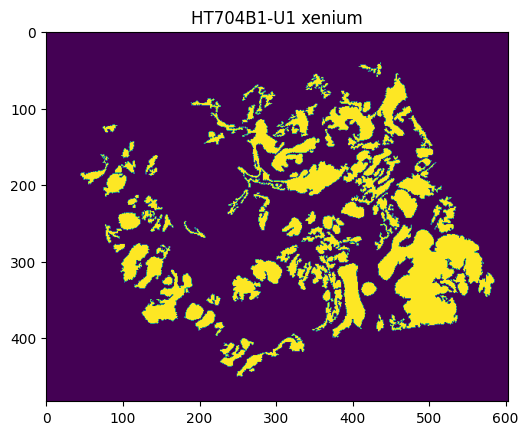

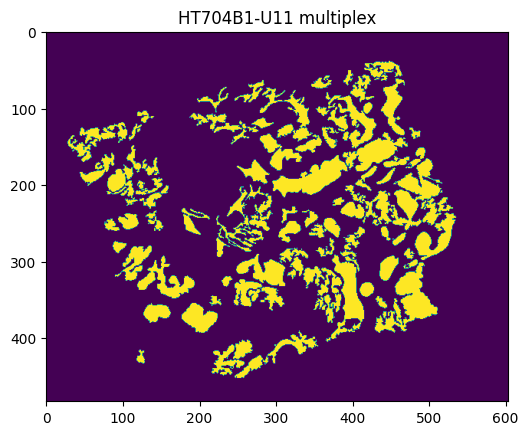

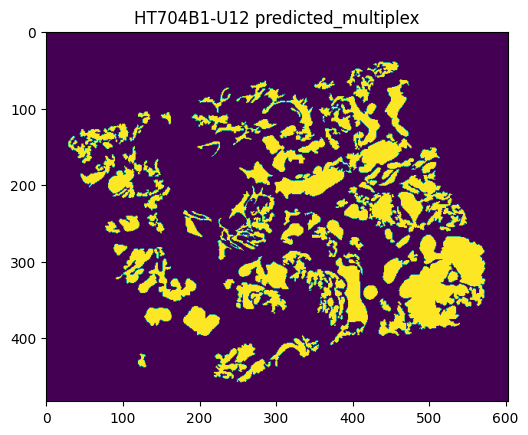

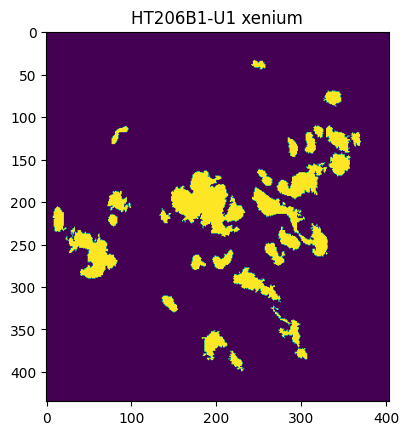

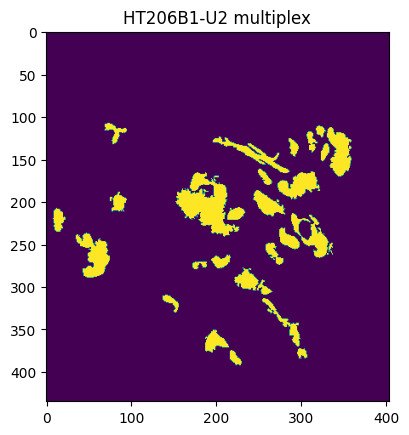

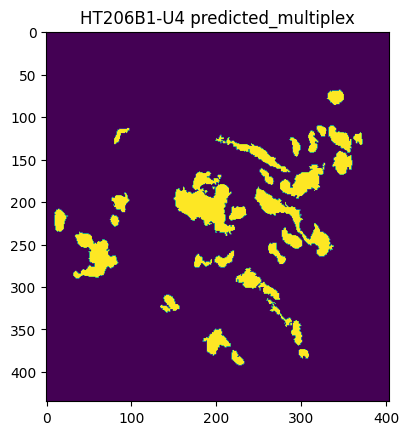

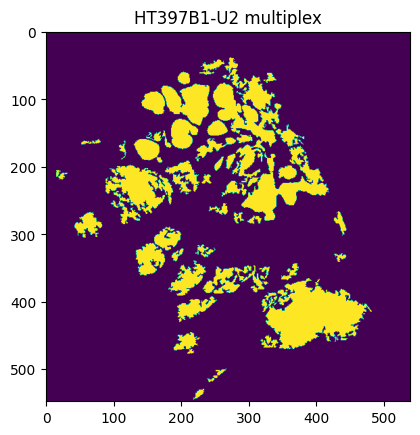

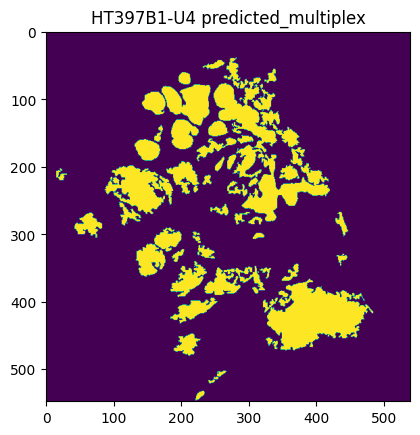

In [11]:
for case, data in case_to_data.items():
    sid_to_dcis_labeled = data['sid_to_dcis_labeled']
    sid_to_dtype = data['sid_to_dtype']
    sid_order = data['sid_order']
    pool, sids = [], []
    for sid, dtype in sid_to_dtype.items():
        if dtype not in pool:
            sids.append(sid)
            pool.append(dtype)

    for sid in sids:
        labeled = sid_to_dcis_labeled[sid]
        plt.imshow(labeled > 0)
        plt.title(sid + ' ' + sid_to_dtype[sid])
        plt.show()


In [12]:
for case, data in case_to_data.items():
    sid_to_dcis_labeled = data['sid_to_dcis_labeled']
    sid_order = data['sid_order']
    
    masks = np.stack([sid_to_dcis_labeled[sid] > 0 for sid in sid_order])
    labeled_volume = skimage.morphology.label(masks)
    props = skimage.measure.regionprops(labeled_volume)
    
    data['labeled_volume'] = labeled_volume
    data['labeled_volume_props'] = props
    
    area_sorted = np.flip(np.argsort([p.area for p in props]))
    area_sorted = np.asarray([p.label for p in props])[area_sorted].tolist()
    data['labels_by_volume'] = area_sorted

In [13]:

for case, data in case_to_data.items():
    dcis_df = data['regions_dcis']
    labeled_volume = data['labeled_volume']
    sid_to_props = data['sid_to_props']
    region_df = data['regions']
    area_sorted = data['labels_by_volume']
    
    region_id_to_dcis_label = {}
    for i, row in dcis_df.iterrows():
        labeled = labeled_volume[row['section_index']]
        p = sid_to_props[row['sid']][row['label'] - 1]
        r1, c1, r2, c2 = p.bbox

        values = np.unique(labeled[r1:r2, c1:c2][p.image])

        assert len(values) == 1
        assert values[0] != 0
        value = values[0]

        region_id_to_dcis_label[i] = int(value)
    region_df['dcis_label'] = [region_id_to_dcis_label.get(x) for x in region_df.index.to_list()]
    region_df['dcis_area_rank'] = [x if pd.isnull(x) else area_sorted.index(x) for x in region_df['dcis_label']]
    
    

100


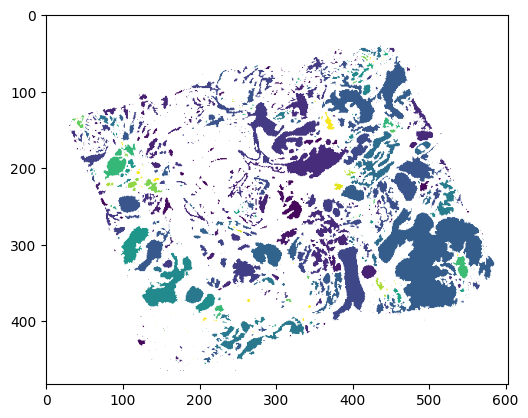

100


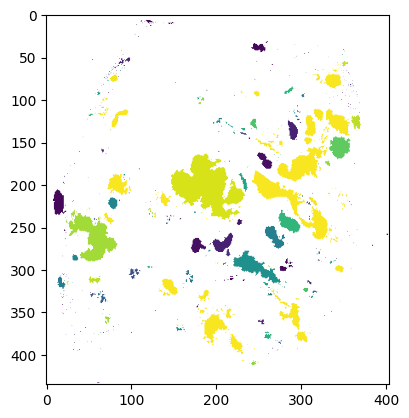

100


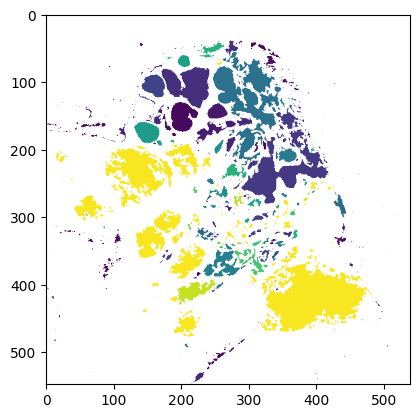

In [14]:
for case, data in case_to_data.items():
    sid_order = data['sid_order']
    sid_to_labeled = data['sid_to_labeled']
    region_df = data['regions']
    
    sid = sid_order[0]
    labeled = sid_to_labeled[sid]
    df = region_df[region_df['sid']==sid]
    rgba = helpers.to_cmapped_rgb(
        labeled, df, hue='immune_external_fraction', label_col='label',
        cmap='viridis', vmax=.2, borders=False)
    plt.imshow(rgba)
    plt.show()

In [15]:
# rgba = helpers.to_cmapped_rgb(
#     labeled, df, hue='dcis_label', label_col='label',
#     force_categorical=True, borders=False)
# plt.imshow(rgba)

In [16]:
# sid_to_position = {entry['sid']:entry['position'] for entry in config['sections']}
# rgba = helpers.to_stacked_rgb(
#     sid_order, sid_to_position, sid_to_labeled, region_df, hue='dcis_label',
#     spacing_scaler=10, squish_scaler=2, force_categorical=True,
# )
# plt.imshow(rgba)

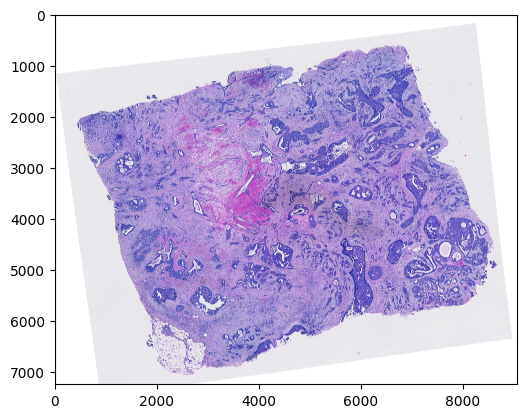

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


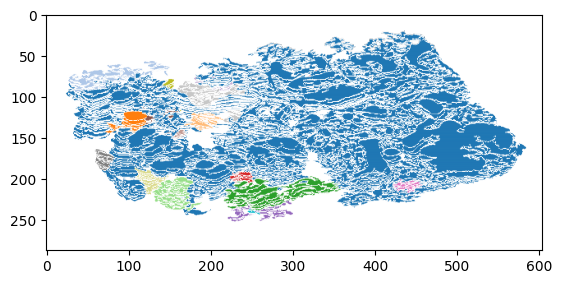

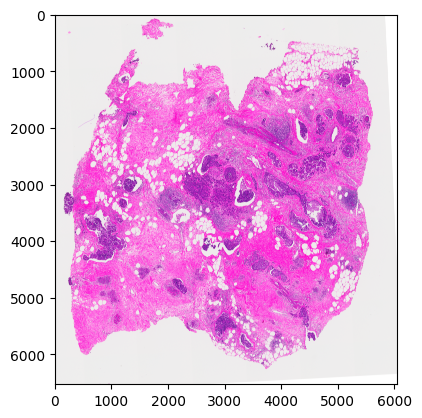

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


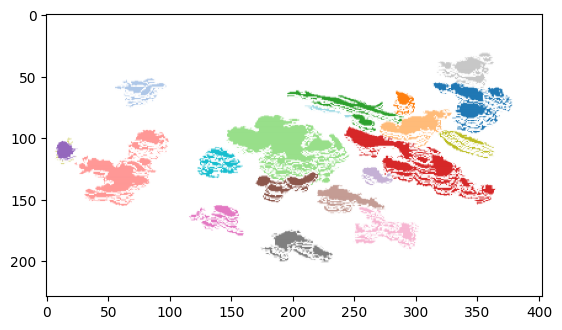

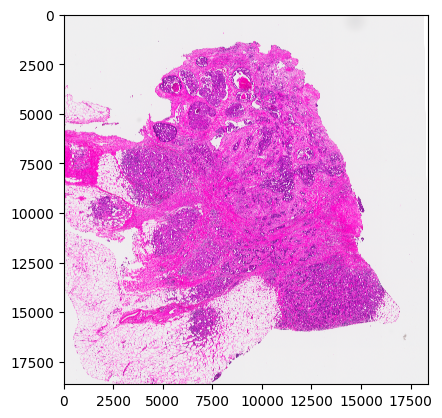

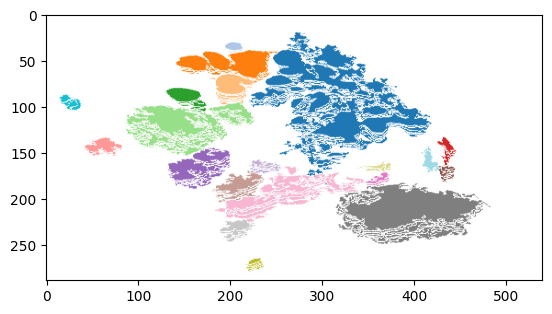

In [17]:
for case, data in case_to_data.items():
    sid_to_position = data['sid_to_position']
    region_df = data['regions']
    sid_to_labeled = data['sid_to_labeled']
    sid_order = data['sid_order']
    config = data['config']
    sid = sid_order[0]
    
    df = region_df[region_df['dcis_area_rank'] < 20]
    
    fp = [entry['data'][0]['filepath'] for entry in config['sections'] if 'he' in entry['data'][0]['dtype']][0]
    fp = fp.replace('/diskmnt/Projects/Users/', '/data/')
    plt.imshow(tifffile.imread(fp))
    plt.show()

    rgba = helpers.to_stacked_rgb(
        sid_order, sid_to_position, sid_to_labeled, df, hue='dcis_label',
        spacing_scaler=10, squish_scaler=2, force_categorical=True,
    )
    plt.imshow(rgba)
    plt.show()

In [19]:
scale_cols_regexs = [
    f'^{x}_.+_{y}$'
    for x in ['multiplex', 'predicted_multiplex', 'xenium']
    for y in ['region', 'boundary', 'external']
]

In [20]:
bins = np.linspace(0, 1, 20)
regions_combined = None
for case, data in case_to_data.items():
    df = data['regions'].copy()
    df['case'] = case
    df['myoepi_boundary_bin'] = np.digitize(df['myoepi_boundary_fraction'], bins)
    
    for c in df.columns:
        for rexp in scale_cols_regexs:
            if re.match(rexp, c):
                df[c] -= df[c].min()
                df[c] /= df[c].std()
                
                val = df[df['myoepi_boundary_bin']==1][c].mean()
#                 print(val)
                
                df[f'{c}_delta'] = df[c] - val
                break
    
    
    if regions_combined is None:
        regions_combined = df
    else:
        regions_combined = pd.concat((regions_combined, df))
regions_combined

/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newfr

/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newfr

/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newfr

/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{c}_delta'] = df[c] - val
/tmp/ipykernel_2838322/3637102020.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newfr

,area,r1,r2,c1,c2,centroid_r,centroid_c,xenium_EPCAM_boundary,xenium_KRT5_boundary,xenium_PTPRC_boundary,...,multiplex_Keratin 14_external_delta,multiplex_Podoplanin_external_delta,multiplex_SMA-(D)_external_delta,multiplex_cKIT-(D)_external_delta,predicted_multiplex_CD45 (D)_boundary_delta,predicted_multiplex_Keratin 14_boundary_delta,predicted_multiplex_CD45 (D)_region_delta,predicted_multiplex_Keratin 14_region_delta,predicted_multiplex_CD45 (D)_external_delta,predicted_multiplex_Keratin 14_external_delta
region_id,,,,,,,,,,,,,,,,,,,,,
HT704B1-U1_0,153.0,37,64,404,442,48.934641,426.248366,2.534371,0.345915,1.050383,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HT704B1-U1_1,1.0,40,49,424,433,44.000000,428.000000,0.830708,0.333374,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HT704B1-U1_2,3.0,40,51,440,450,45.000000,444.666667,0.352422,0.159110,0.570168,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HT704B1-U1_3,33.0,40,54,442,459,46.303030,450.818182,3.111611,1.333494,0.679483,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HT704B1-U1_4,2.0,42,51,377,387,46.000000,381.500000,0.538971,0.114597,0.328766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-U31_642,23.0,526,540,222,236,532.652174,228.695652,NaN,NaN,NaN,...,-0.000574,-0.602650,-0.676588,-0.331475,NaN,NaN,NaN,NaN,NaN,NaN
HT397B1-U31_643,1.0,531,540,190,199,535.000000,194.000000,NaN,NaN,NaN,...,0.012772,-0.602650,-0.709030,0.104191,NaN,NaN,NaN,NaN,NaN,NaN
HT397B1-U31_644,1.0,532,541,123,132,536.000000,127.000000,NaN,NaN,NaN,...,0.012772,-0.602650,-0.677342,-0.704262,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
case_to_data['HT206B1']['sid_to_tiled'].keys()

dict_keys(['HT206B1-U1', 'HT206B1-U8', 'HT206B1-U9', 'HT206B1-U16', 'HT206B1-U17', 'HT206B1-U24', 'HT206B1-U2', 'HT206B1-U5', 'HT206B1-U10', 'HT206B1-U13', 'HT206B1-U18', 'HT206B1-U21', 'HT206B1-U4', 'HT206B1-U12', 'HT206B1-U20'])

In [90]:
data.keys()

dict_keys(['dtype_to_channels', 'dtype_to_thresholds', 'dtype_to_masks', 'dtype_to_tiled', 'sid_order', 'sid_to_dtype', 'sid_to_position', 'sid_to_labeled', 'sid_to_mask', 'sid_to_tiled', 'regions', 'sid_to_props', 'config', 'sid_to_dcis_labeled', 'regions_dcis', 'labeled_volume', 'labeled_volume_props', 'labels_by_volume'])

In [123]:
dtype_to_sum_thres = {
    'xenium': 0,
    'multiplex': 1,
    'predicted_multiplex': 1
}

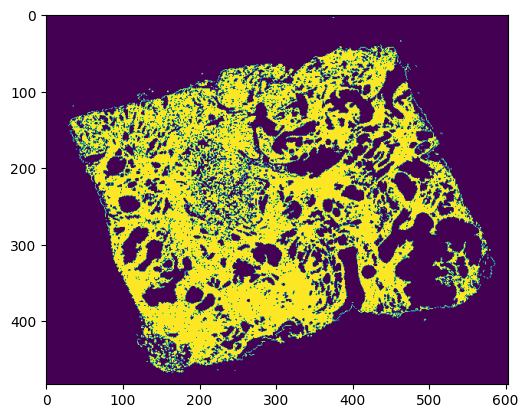

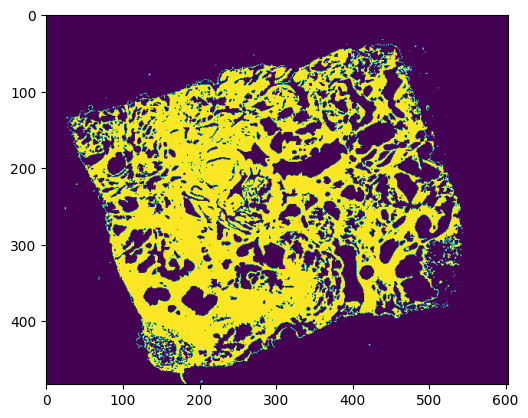

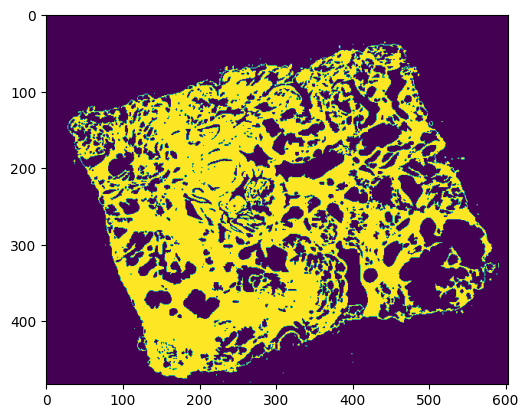

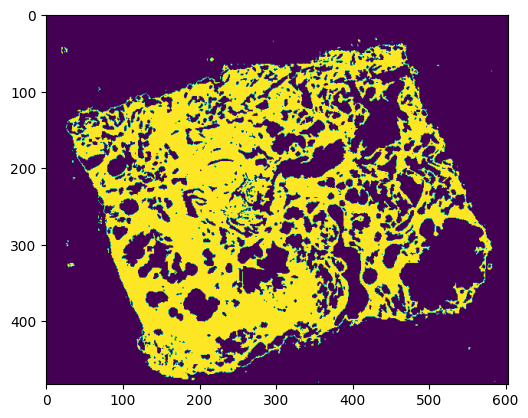

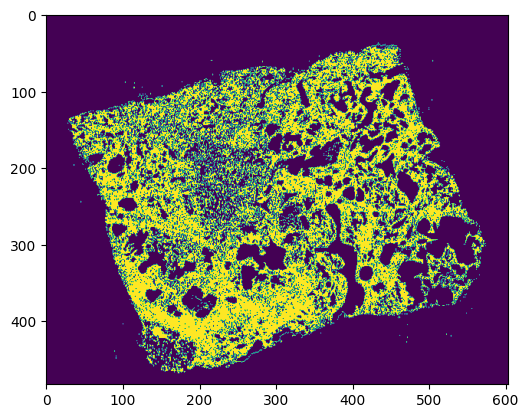

...

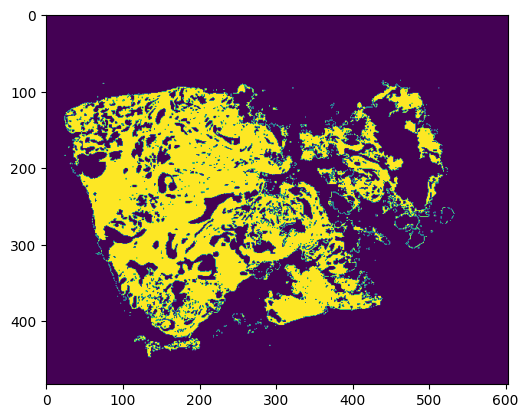

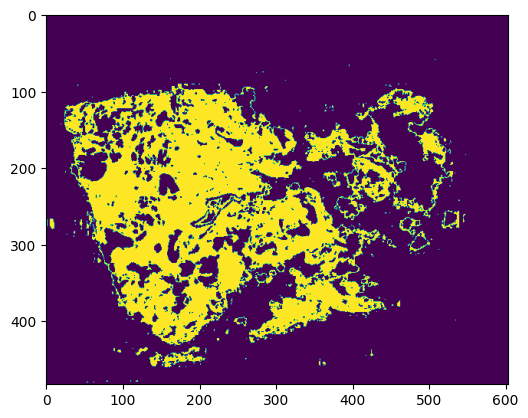

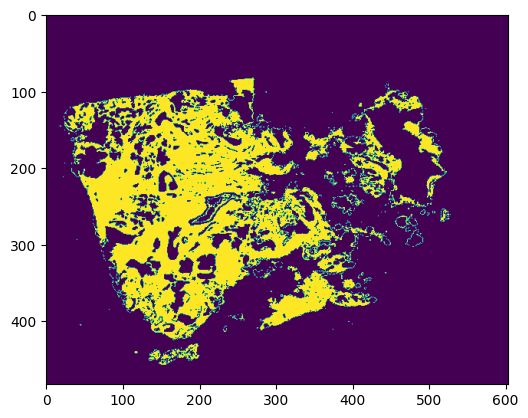

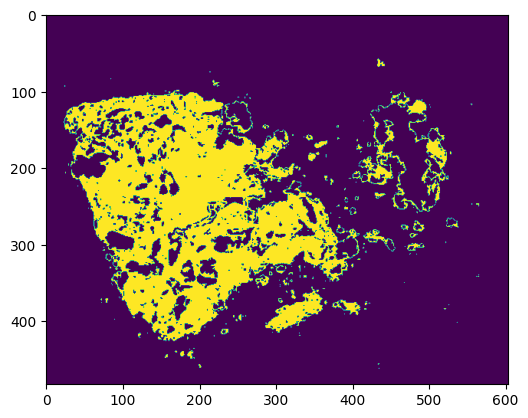

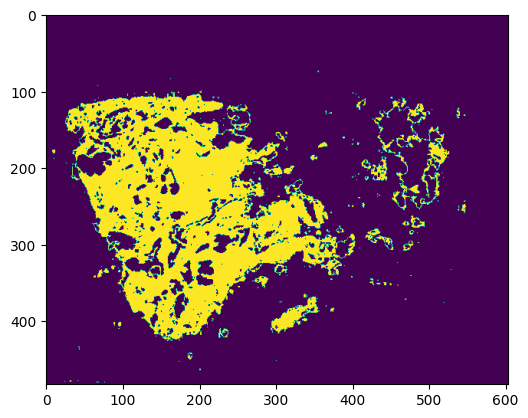

((1537752, 3), (3224778, 3))

In [179]:
data = case_to_data['HT704B1']
sid_to_labeled = data['sid_to_labeled']
sid_to_position = data['sid_to_position']
sid_to_tiled = data['sid_to_tiled']
sid_to_dtype = data['sid_to_dtype']
sid_order = data['sid_order']
dtype_to_channels = data['dtype_to_channels']


# tiled = data['sid_to_tiled']['HT704B1-U1']
# labeled = data['sid_to_labeled']['HT704B1-U1']

sid_indices = []
tumor_pts, tme_pts = [], []
for i, sid in enumerate(sid_order):
    tiled = sid_to_tiled[sid]
    labeled = sid_to_labeled[sid]
    
    thresh = dtype_to_sum_thres[sid_to_dtype[sid]]
    tissue_mask = tiled.mean(0) <= thresh
    z = sid_to_position[sid] / tiling_resolution
    hs, ws = np.where(labeled > 0)
    tumor_pts.append(rearrange(np.stack([[z] * len(hs), hs, ws]), 'd n -> n d'))
    
    plt.imshow((labeled == 0) & ~tissue_mask)
    plt.show()
    hs, ws = np.where((labeled == 0) & ~tissue_mask)
    tme_pts.append(rearrange(np.stack([[z] * len(hs), hs, ws]), 'd n -> n d'))
    
    sid_indices += [i] * len(hs)
sid_indices = np.asarray(sid_indices)
tumor_pts = np.concatenate(tumor_pts)
tme_pts = np.concatenate(tme_pts)
tumor_pts.shape, tme_pts.shape

In [141]:
# volume = data['labeled_volume']
# volume.shape, labeled.shape, tiled.shape

In [180]:
from sklearn.neighbors import NearestNeighbors

In [181]:
nn = NearestNeighbors(n_neighbors=1)
nn.fit(tumor_pts)

NearestNeighbors(n_neighbors=1)

In [182]:
# graph = nn.kneighbors_graph(tme_pts, n_neighbors=1, mode='distance')

In [192]:
distances, idxs = nn.kneighbors(tme_pts)

In [183]:
n = 10
tme_pts[:n], tumor_pts[:n]

(array([[  0.,   4., 374.],
        [  0.,   4., 375.],
        [  0.,  34., 462.],
        [  0.,  35., 462.],
        [  0.,  35., 463.],
        [  0.,  40., 436.],
        [  0.,  41., 437.],
        [  0.,  42., 383.],
        [  0.,  42., 384.],
        [  0.,  42., 428.]]),
 array([[  0.,  41., 436.],
        [  0.,  42., 436.],
        [  0.,  43., 433.],
        [  0.,  43., 434.],
        [  0.,  43., 435.],
        [  0.,  44., 410.],
        [  0.,  44., 411.],
        [  0.,  44., 412.],
        [  0.,  44., 413.],
        [  0.,  44., 414.]]))

In [186]:
n = 10
tme_pts[100000:100000+n], tumor_pts[100000:100000+n], graph.data[100000:100000+n]

(array([[  3.33333333, 113.        , 241.        ],
        [  3.33333333, 113.        , 242.        ],
        [  3.33333333, 113.        , 243.        ],
        [  3.33333333, 113.        , 244.        ],
        [  3.33333333, 113.        , 245.        ],
        [  3.33333333, 113.        , 246.        ],
        [  3.33333333, 113.        , 247.        ],
        [  3.33333333, 113.        , 248.        ],
        [  3.33333333, 113.        , 249.        ],
        [  3.33333333, 113.        , 250.        ]]),
 array([[  3.33333333, 325.        , 163.        ],
        [  3.33333333, 325.        , 164.        ],
        [  3.33333333, 325.        , 165.        ],
        [  3.33333333, 325.        , 166.        ],
        [  3.33333333, 325.        , 167.        ],
        [  3.33333333, 325.        , 168.        ],
        [  3.33333333, 325.        , 169.        ],
        [  3.33333333, 325.        , 170.        ],
        [  3.33333333, 325.        , 171.        ],
        [ 

In [191]:
nn.kneighbors(tme_pts[100000:100000+n])

(array([[1.        ],
        [0.33333333],
        [0.33333333],
        [0.33333333],
        [1.        ],
        [0.33333333],
        [0.33333333],
        [0.33333333],
        [1.05409255],
        [2.02758751]]),
 array([[ 62390],
        [118961],
        [118962],
        [118963],
        [ 62238],
        [118964],
        [118965],
        [118966],
        [118966],
        [118966]]))

In [189]:
d, idx = nn.kneighbors([[  3.33333333, 113.        , 241.        ]])
tumor_pts[idx], d

(array([[[  3.33333333, 113.        , 240.        ]]]), array([[1.]]))

In [194]:

tme_df = None
for i, sid in enumerate(sid_order):
    dtype = sid_to_dtype[sid]
    mask = sid_indices == i
    pts = tme_pts[mask].astype(int)
    dists = distances[mask]
    
    tiled = sid_to_tiled[sid].astype(np.float32)
    tiled -= tiled.min((-2, -1), keepdims=True)
    tiled /= tiled.std((-2, -1), keepdims=True)
    
    vals = tiled[:, pts[:, 1], pts[:, 2]]
    df = pd.DataFrame(data=vals.T, columns=dtype_to_channels[dtype])
    df.columns = [f'{dtype}_{c}_intensity' for c in df.columns]
    df['sid'] = sid
    df['distance'] = dists
    
    if tme_df is None:
        tme_df = df
    else:
        tme_df = pd.concat((tme_df, df))
tme_df.index = np.arange(tme_df.shape[0])
tme_df
    
    



,xenium_EPCAM_intensity,xenium_KRT5_intensity,xenium_PTPRC_intensity,xenium_CD4_intensity,xenium_CD8A_intensity,xenium_MS4A1_intensity,xenium_CD68_intensity,xenium_CD163_intensity,xenium_ACTA2_intensity,xenium_PDPN_intensity,...,multiplex_Ki67_intensity,multiplex_MGP (D)_intensity,multiplex_Pan-Cytokeratin_intensity,multiplex_Podoplanin (D)_intensity,multiplex_SMA (D)_intensity,predicted_multiplex_CD3e_intensity,predicted_multiplex_CD68_intensity,predicted_multiplex_HLA-DR_intensity,predicted_multiplex_Keratin 5_intensity,predicted_multiplex_Pan-Cytokeratin_intensity
0,0.0,0.000000,1.060722,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.000000,0.578576,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.064957,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.562573,0.000000,0.0,0.0,0.0,0.0,0.0,1.039314,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.125016,0.000000,0.0,0.0,0.0,0.0,0.0,0.324786,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3224773,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.336683,1.056924,0.186887,0.0,0.0
3224774,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000000,0.704616,0.000000,0.0,0.0
3224775,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.336683,0.704616,0.186887,0.0,0.0
3224776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.336683,0.587180,0.186887,0.0,0.0


In [195]:
bins = np.linspace(0, tme_df['distance'].max(), int(tme_df['distance'].max()))
tme_df['distance_bin'] = np.digitize(tme_df['distance'], bins=bins)
tme_df['distance_bin'][tme_df['distance_bin']>10] = 10

/tmp/ipykernel_2838322/2176668644.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tme_df['distance_bin'][tme_df['distance_bin']>10] = 10


In [196]:
bins

array([  0.        ,   1.01942275,   2.03884549,   3.05826824,
         4.07769098,   5.09711373,   6.11653647,   7.13595922,
         8.15538196,   9.17480471,  10.19422746,  11.2136502 ,
        12.23307295,  13.25249569,  14.27191844,  15.29134118,
        16.31076393,  17.33018667,  18.34960942,  19.36903217,
        20.38845491,  21.40787766,  22.4273004 ,  23.44672315,
        24.46614589,  25.48556864,  26.50499138,  27.52441413,
        28.54383688,  29.56325962,  30.58268237,  31.60210511,
        32.62152786,  33.6409506 ,  34.66037335,  35.67979609,
        36.69921884,  37.71864159,  38.73806433,  39.75748708,
        40.77690982,  41.79633257,  42.81575531,  43.83517806,
        44.8546008 ,  45.87402355,  46.8934463 ,  47.91286904,
        48.93229179,  49.95171453,  50.97113728,  51.99056002,
        53.00998277,  54.02940551,  55.04882826,  56.06825101,
        57.08767375,  58.1070965 ,  59.12651924,  60.14594199,
        61.16536473,  62.18478748,  63.20421022,  64.22

In [204]:
np.count_nonzero(tme_df['distance'] < 7) / len(tme_df)

0.992943700310533

<Axes: xlabel='distance_bin', ylabel='xenium_CD68_intensity'>

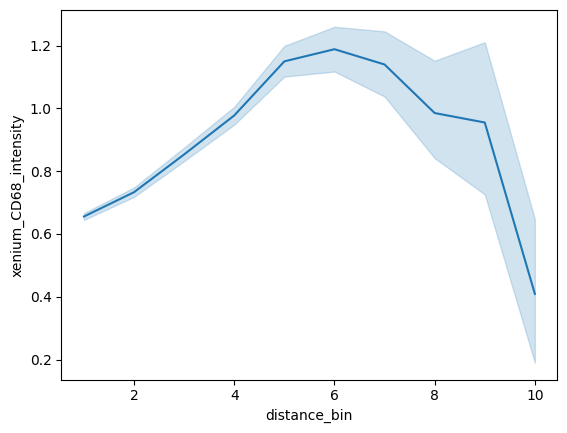

In [199]:
idxs = np.random.choice(np.arange(tme_df.shape[0]), size=1000000, replace=False)
sns.lineplot(data=tme_df.iloc[idxs], x='distance_bin', y='xenium_CD68_intensity')

<Axes: xlabel='distance', ylabel='xenium_CD68_intensity'>

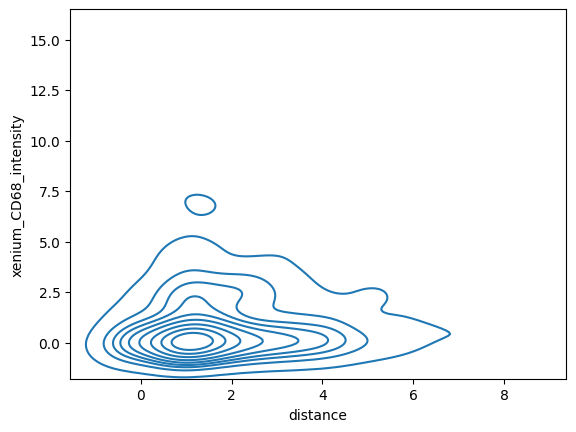

In [160]:
idxs = np.random.choice(np.arange(tme_df.shape[0]), size=2000, replace=False)
sns.kdeplot(data=tme_df.iloc[idxs], x='distance', y='xenium_CD68_intensity')

In [128]:
graph.shape

(3224778, 1537752)

In [ ]:
bins = np.linspace(0, int(graph.data.max()) + 1, 1)

In [136]:
graph.data

array([42.57933771, 42.42640687,  9.11043358, ..., 28.75760769,
       28.03569154, 23.02172887])

In [137]:
graph.indices

array([    44,     44, 680033, ..., 494046, 494046, 494046], dtype=int32)

In [ ]:
tme_pts_indexed[:, 0]

In [93]:
x = skimage.segmentation.expand_labels(volume)

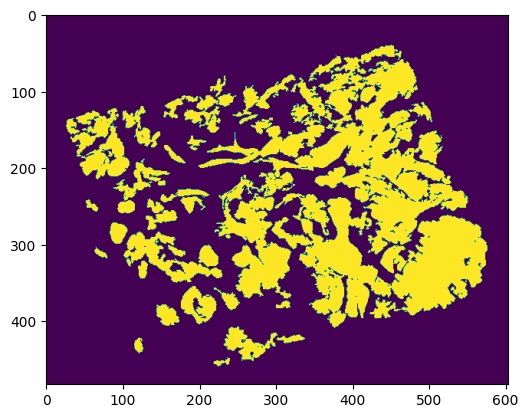

In [95]:
plt.imshow(x[10]>0)

In [58]:
# immune plots
# data = case_to_data['HT704B1']
# tiled = data['sid_to_tiled']['HT704B1-U1']
# labeled = data['sid_to_labeled']['HT704B1-U1']

data = case_to_data['HT206B1']
tiled = data['sid_to_tiled']['HT206B1-U1']
labeled = data['sid_to_labeled']['HT206B1-U1']

channels = data['dtype_to_channels']['xenium']
tiled.shape, channels

((14, 435, 403),
 ['EPCAM',
  'PTPRC',
  'CD4',
  'CD8A',
  'MS4A1',
  'CD68',
  'CD163',
  'ACTA2',
  'PDPN',
  'HLA-DQB2',
  'LAG3',
  'PDCD1',
  'GZMB',
  'PECAM1'])

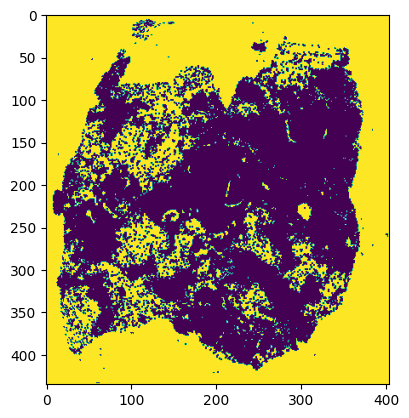

In [59]:
tissue_mask = tiled.sum(0) == 0
plt.imshow(tissue_mask)

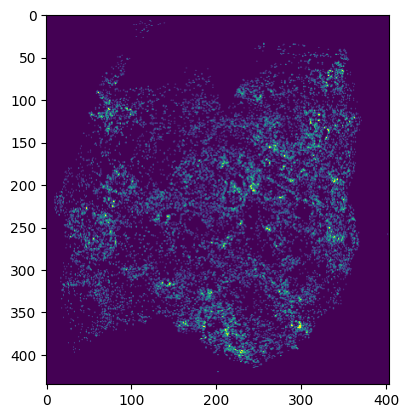

In [60]:
plt.imshow(tiled[channels.index('CD68')], vmax=100)

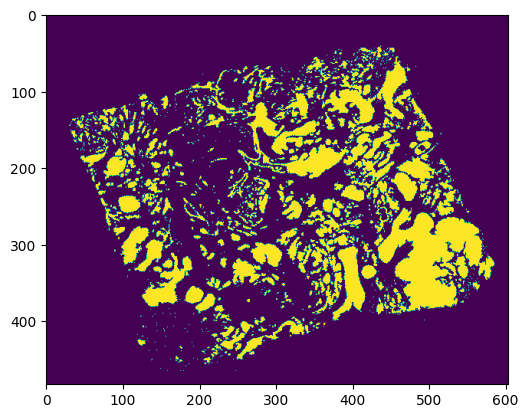

In [61]:
plt.imshow(mask)

In [84]:
dist = 1
max_count = 20
tme_labels = np.zeros_like(labeled)
labeled_regions = labeled.copy()
count = 1
while True:
    print(count)
    expanded = skimage.segmentation.expand_labels(labeled_regions, distance=dist)
    expanded[tissue_mask] = 0
    ring = (expanded > 0) ^ (labeled_regions > 0)
    
    if np.count_nonzero(ring) == 0 or count == max_count:
        break
    
    tme_labels[ring] = count
    
    count += 1
    labeled_regions = expanded

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


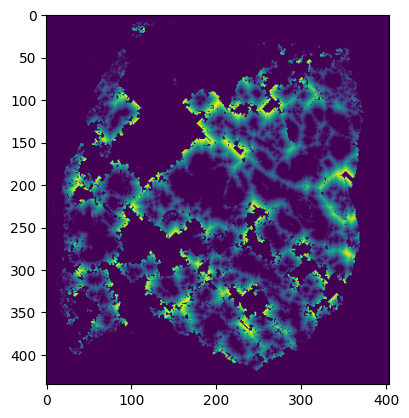

In [85]:
plt.imshow(tme_labels)

In [86]:
props = skimage.measure.regionprops(tme_labels, rearrange(tiled, 'c h w -> h w c'))
data = []
for p in props:
    row = [p.label, p.area]
    print(p.intensity_mean.shape)
    row += p.intensity_mean.tolist()
    data.append(row)
cols = ['label', 'area']
cols += channels

tme_df = pd.DataFrame(data=data, columns=cols)
tme_df
    

(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)
(14,)


,label,area,EPCAM,PTPRC,CD4,CD8A,MS4A1,CD68,CD163,ACTA2,PDPN,HLA-DQB2,LAG3,PDCD1,GZMB,PECAM1
0,1,7172.0,3.315114,18.625070,20.900864,7.857780,1.717931,15.063441,15.529699,15.578918,14.581428,14.934746,5.537228,1.815254,3.838399,21.429866
1,2,6602.0,0.828840,22.322175,23.547410,10.552105,2.134505,14.622387,17.391851,9.790518,12.698273,14.875795,5.956377,1.926689,4.864889,24.167676
2,3,5983.0,0.564600,22.276784,22.415009,10.692963,2.079224,13.014040,16.992144,6.489554,11.133211,13.031088,6.006686,1.518970,4.966906,23.375731
3,4,5304.0,0.483032,21.065611,21.011312,10.275075,1.826546,11.942496,16.395362,5.205694,10.842949,11.141026,5.604072,1.604638,4.523756,21.592195
4,5,4586.0,0.504143,19.601177,19.179241,9.878543,1.508286,11.022678,15.994549,4.926297,10.605539,9.399259,6.028347,1.492804,4.047972,19.958352
5,6,3873.0,0.489285,17.270075,16.712884,8.965401,1.302091,9.975213,14.747224,4.731991,10.641621,7.811774,5.531887,1.371547,3.434030,18.757810
6,7,3219.0,0.377136,15.410065,14.982293,7.725070,1.221497,8.696490,13.502951,4.149115,9.716372,6.826965,4.941907,1.175210,2.743709,17.646163
7,8,2843.0,0.376715,14.491382,14.164615,7.319733,1.083714,8.650721,13.404502,3.993317,10.096729,6.466760,4.097081,1.191699,2.592684,17.714034
8,9,2574.0,0.364025,13.213675,13.172883,6.831002,0.985237,8.473582,13.564491,3.911033,9.464646,5.865579,3.459596,1.322455,2.401709,17.338772
9,10,2268.0,0.331129,12.320106,12.600970,6.432540,0.846561,8.351411,13.126543,3.565697,9.200176,5.392857,3.268078,1.047619,2.154762,16.683422


<Axes: xlabel='label', ylabel='CD68'>

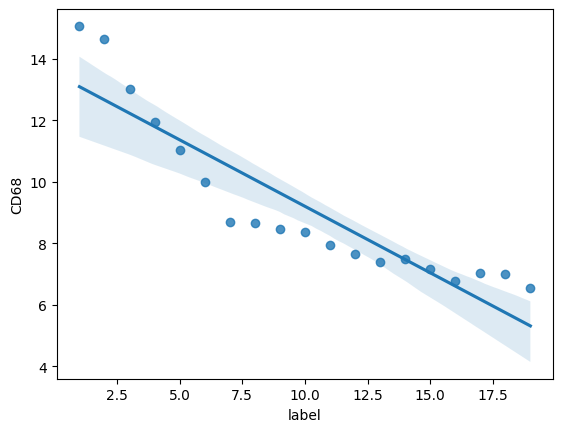

In [87]:
sns.regplot(tme_df, x='label', y='CD68')

<Axes: xlabel='label', ylabel='PECAM1'>

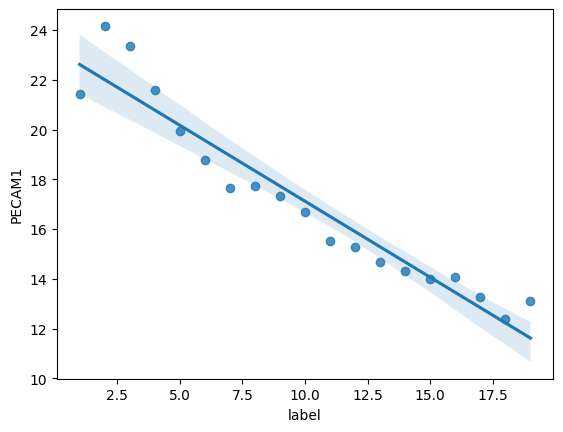

In [88]:
sns.regplot(tme_df, x='label', y='PECAM1')

In [ ]:
def get_morphology_label(frac):
    if frac < .1:
        return 'IDC'
    if frac < .7:
        return 'partial IDC'
    return 'DCIS'
    
regions_combined['morphology_label'] = [get_morphology_label(x)
                                        for x in regions_combined['myoepi_boundary_fraction']]

In [ ]:
df = regions_combined[[True if x in ['xenium', 'multiplex'] else False for x in regions_combined['dtype']]]
df

In [ ]:
order = ['IDC', 'partial IDC', 'DCIS']

sns.boxplot(data=df, x='case', y='immune_external_fraction',hue='morphology_label', hue_order=order)

In [ ]:
sns.boxplot(data=df, x='case', y='xenium_CD8A_external',hue='morphology_label', hue_order=order, fliersize=0)
plt.ylim(-.5, 3.)

In [ ]:
sns.boxplot(data=df, x='case', y='xenium_CD8A_boundary',hue='morphology_label', hue_order=order, fliersize=0)
plt.ylim(-.5, 3.)

In [ ]:
sns.boxplot(data=df, x='case', y='multiplex_CD8_external',hue='morphology_label', hue_order=order, fliersize=0)
plt.ylim(-.5, 4.)

In [ ]:
sns.boxplot(data=df, x='case', y='multiplex_CD68_external',hue='morphology_label', hue_order=order, fliersize=0)
plt.ylim(-.5, 4.)

In [ ]:
sns.boxplot(data=df, x='case', y='xenium_CD68_external',hue='morphology_label', hue_order=order, fliersize=0)
plt.ylim(-.5, 5.)

In [ ]:
df['myoepi_boundary_bin'].min()

In [ ]:
bins = np.linspace(0, 1, 20)
df['myoepi_boundary_bin'] = np.digitize(df['myoepi_boundary_fraction'], bins)

In [ ]:
sns.boxplot(data=df, x='myoepi_boundary_bin', y='immune_external_fraction', hue='case', fliersize=0)

f = df[df['case']=='HT704B1']
sns.regplot(data=f, x='myoepi_boundary_bin', y='immune_external_fraction', order=2, scatter=False, )

In [ ]:
sns.boxplot(data=df, x='myoepi_boundary_bin', y='xenium_CD68_external', hue='case', fliersize=0, width=2.5, whis=False)

In [ ]:
sns.boxplot(data=df, x='myoepi_boundary_bin', y='multiplex_CD8_external', hue='case', fliersize=0, width=2.5, whis=False)

In [ ]:
sns.lineplot(data=df, x='myoepi_boundary_bin', y='multiplex_CD8_external', hue='case')





In [ ]:
# df['multiplex_CD8_external_delta'] = df['multiplex_CD8_external_delta'] - df[df['myoepi_boundary_bin']==1]['multiplex_CD8_external_delta'].min()
sns.lineplot(data=df, x='myoepi_boundary_bin', y='multiplex_CD8_external_delta', hue='case')
plt.axhline(0, c='gray')

In [ ]:
sns.scatterplot(data=df, x='myoepi_boundary_fraction', y='xenium_CD68_external', hue='case')

In [ ]:
f = df[df['case']=='HT704B1']
sns.regplot(data=f, x='myoepi_boundary_fraction', y='multiplex_CD8_external',
            x_bins=np.arange(0, 1, 100), order=2)

In [ ]:
f = df[df['case']=='HT206B1']
sns.regplot(data=f, x='myoepi_boundary_fraction', y='multiplex_CD8_external',
            x_bins=np.arange(0, 1, 100), order=2)

In [ ]:
f = df[df['case']=='HT397B1']
sns.regplot(data=f, x='myoepi_boundary_fraction', y='multiplex_CD8_external',
            x_bins=np.arange(0, 1, 100), order=2)